# Project 4: Advanced Lane Finding

## Camera Calibration

Disable autoscroll in this Jupyter notebook. Borrowed from the following link.
* https://github.com/minrk/ipython_extensions/blob/e8a280f8d0bda1176f70e39cfa2537ee3400446c/extensions/disable_autoscroll.py

In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

### Criteria: Briefly state how you computed the camera matrix and distortion coefficients. Provide an example of a distortion corrected calibration image.

I computed the camera matrix and distortion coefficients with the chessboard images using `cv2.calibrateCamera` and `cv2.undistort`. `cv2.calibrateCamera` gives the camera matrix and distortion coefficients. I will undistorte the images `cv2.undistort` with the parameters.

Writing to output_images/undistorted_calibration10.jpg...
done.
Writing to output_images/undistorted_calibration11.jpg...
done.
Writing to output_images/undistorted_calibration12.jpg...
done.
Writing to output_images/undistorted_calibration13.jpg...
done.
Writing to output_images/undistorted_calibration14.jpg...
done.
Writing to output_images/undistorted_calibration15.jpg...
done.
Writing to output_images/undistorted_calibration16.jpg...
done.
Writing to output_images/undistorted_calibration17.jpg...
done.
Writing to output_images/undistorted_calibration18.jpg...
done.
Writing to output_images/undistorted_calibration19.jpg...
done.
Writing to output_images/undistorted_calibration2.jpg...
done.
Writing to output_images/undistorted_calibration20.jpg...
done.
Writing to output_images/undistorted_calibration3.jpg...
done.
Writing to output_images/undistorted_calibration6.jpg...
done.
Writing to output_images/undistorted_calibration7.jpg...
done.
Writing to output_images/undistorted_calibra

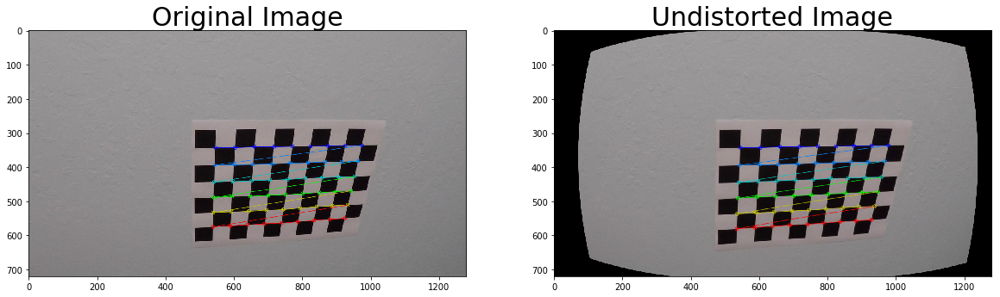

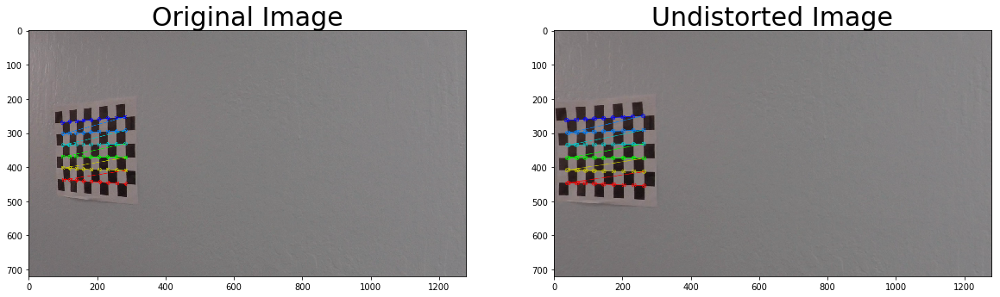

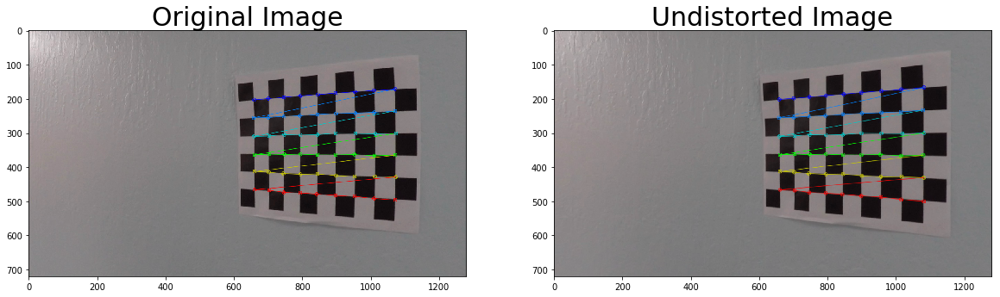

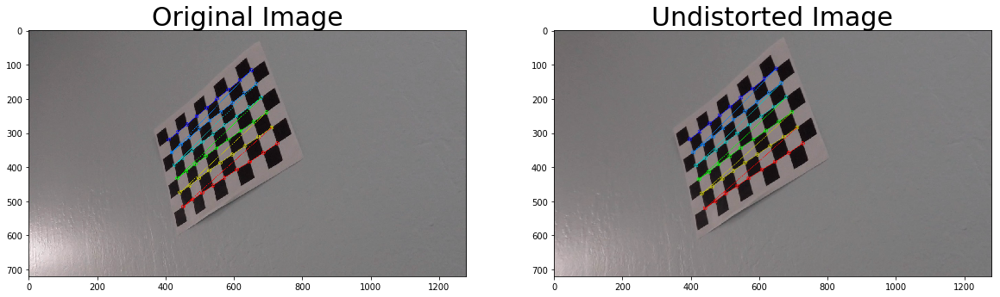

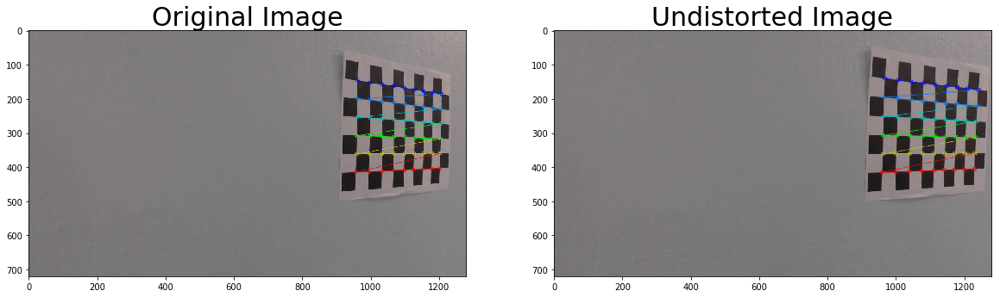

...

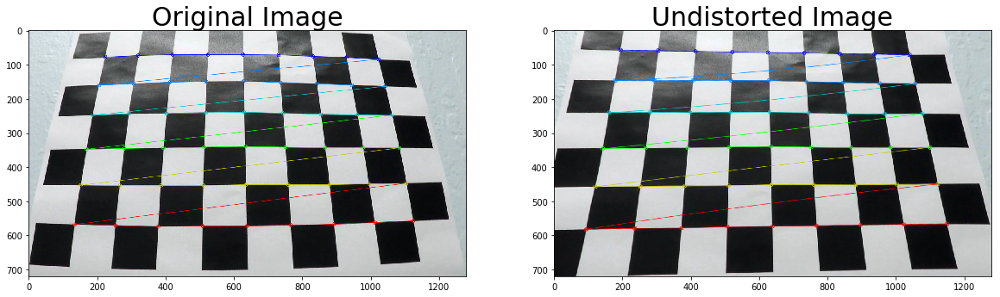

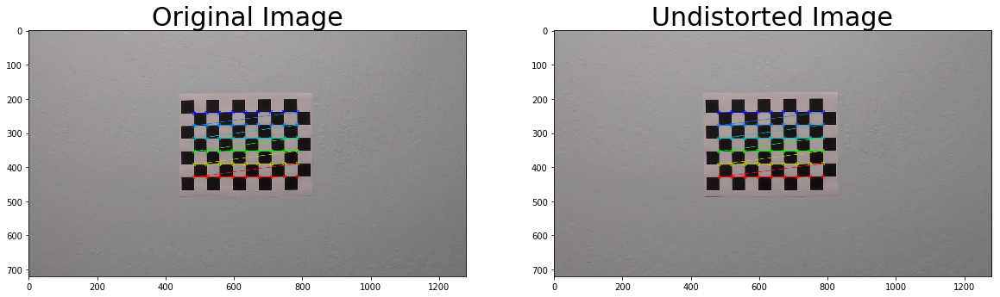

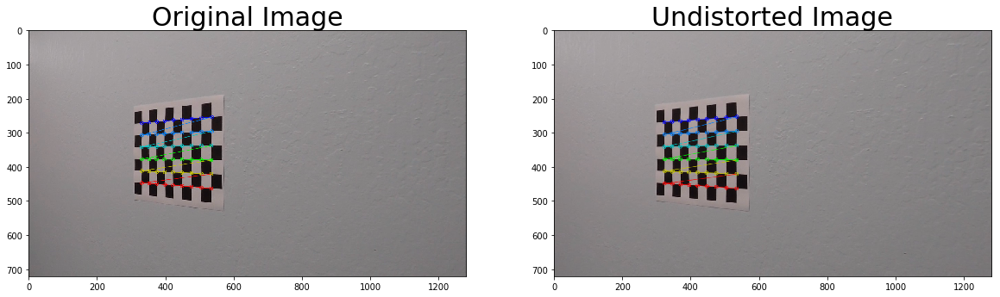

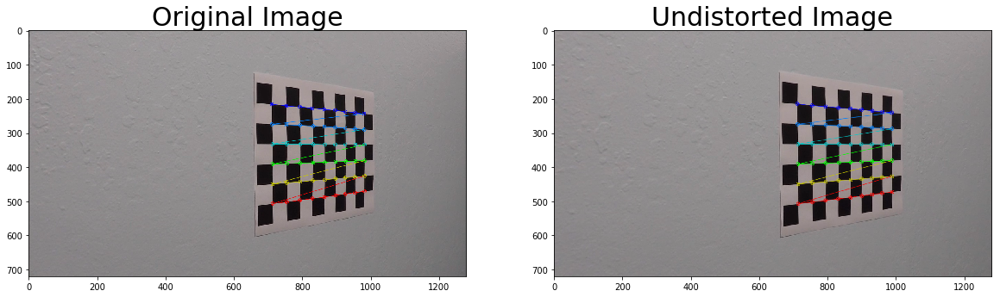

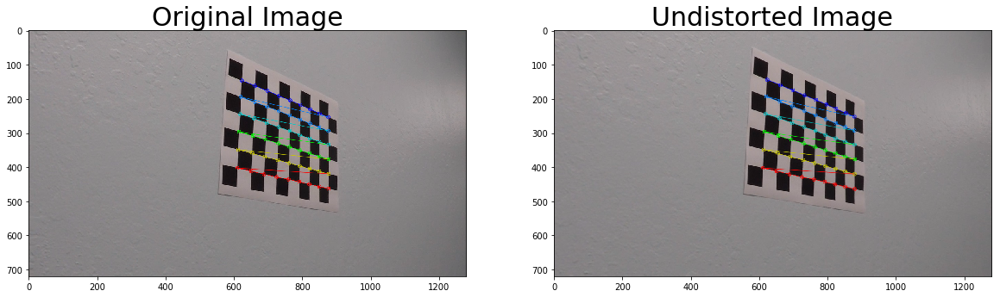

In [2]:
import os
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

def calculate_undistorted(img, objpoints, imgpoints):
    ret, mat, dist, _, _ = cv2.calibrateCamera(
        objpoints, imgpoints, img.shape[0:2][::-1], None, None)
    undist = cv2.undistort(img, mat, dist, None, mat)
    return undist, mat, dist

mat = None
dist = None

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        # Calculate the undistorted image and its matrix
        undistorted, mat, dist = calculate_undistorted(img, objpoints, imgpoints)
        
        # Save undistorted iamge.
        dst_fname = os.path.basename(fname)
        print('Writing to output_images/undistorted_' + dst_fname + '...')
        cv2.imwrite("output_images/undistorted_" + dst_fname, undistorted)
        print('done.')

        # The following code visualizes the original and the undistorted
        # image. It works on Jupyter notebook.
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(undistorted)
        ax2.set_title('Undistorted Image', fontsize=30)
        plt.figure(i)

## Pipeline (test images)

### Critetria: Provide an example of a distortion-corrected image.

I'm listing the original and the undistorted images by the camera matrix and the distortion coefficents retrieved in the previous step side by side. The differences are recognizable when we see the edges of the images.

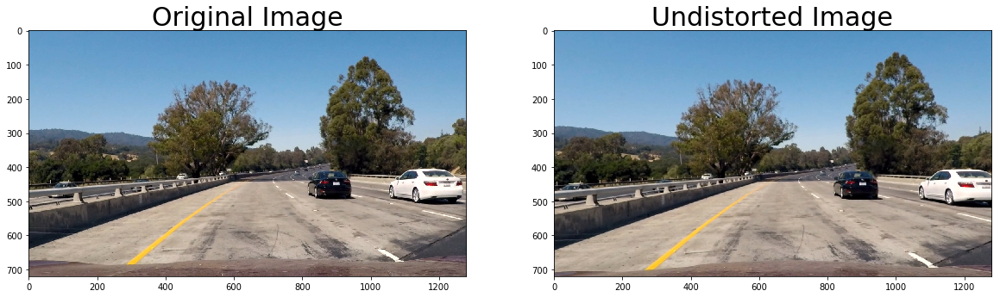

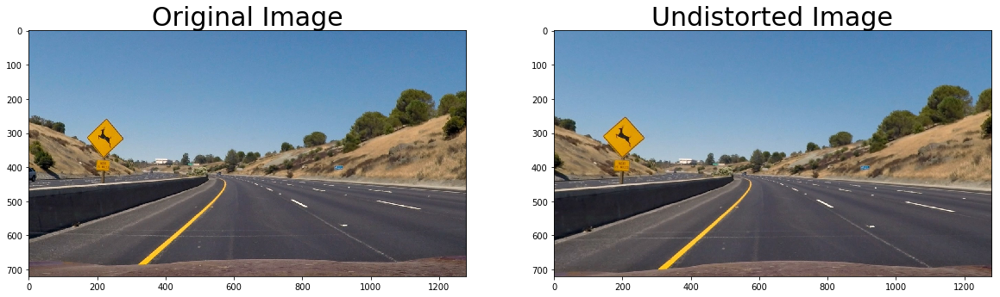

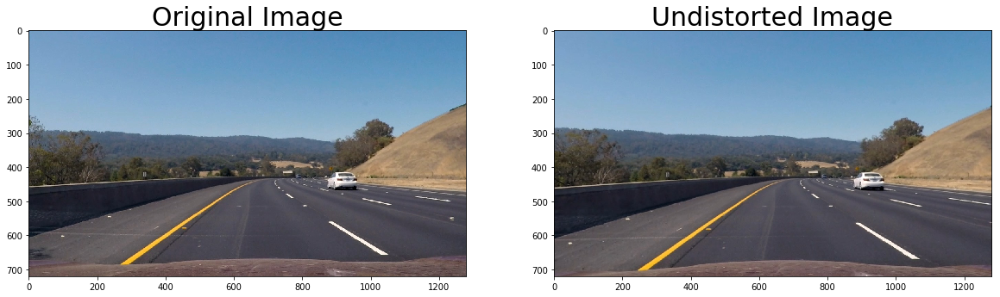

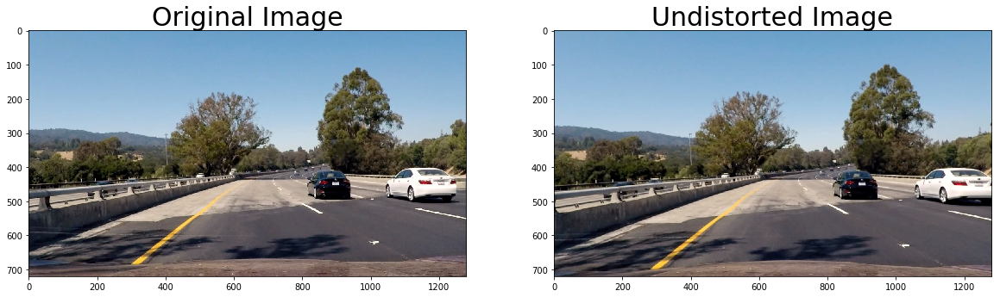

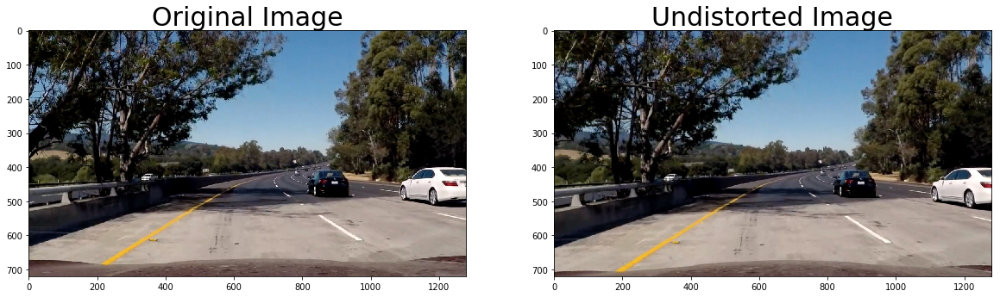

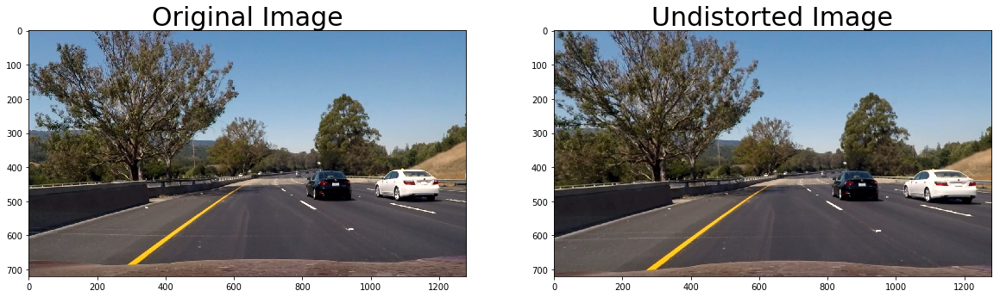

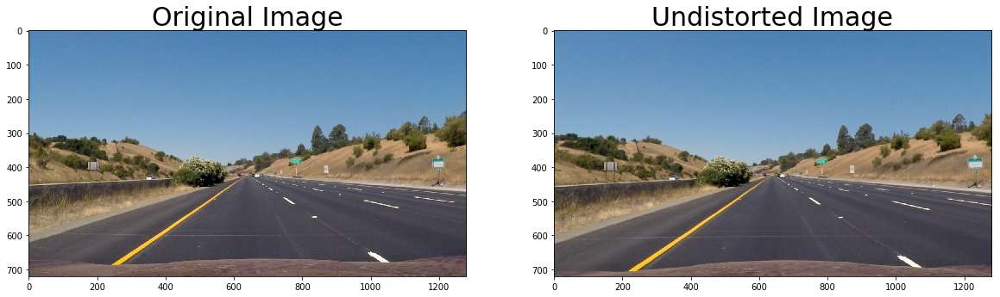

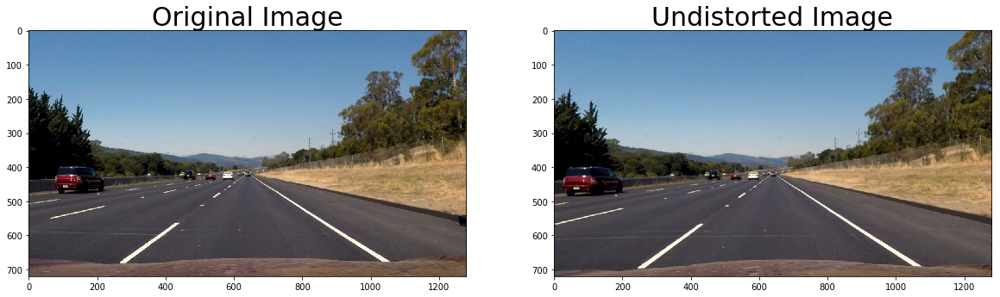

In [3]:
import matplotlib.image as mpimg
straight_lines = glob.glob('test_images/straight_lines*.jpg')
raw_images = glob.glob('test_images/test*.jpg') + straight_lines
undistorted_images = []

for i, fname in enumerate(raw_images):
    img = mpimg.imread(fname)
    # Undistort the image with the undistort matrix retrieved from the
    # previous chessboard step.
    undistorted = cv2.undistort(img, mat, dist, None, mat)
    undistorted_images.append(undistorted)
    
    dst_fname = os.path.basename(fname)
    
    undistorted_bgr = cv2.cvtColor(undistorted, cv2.COLOR_RGB2BGR)
    cv2.imwrite("output_images/undistorted_" + dst_fname, undistorted_bgr)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=30)
    plt.figure(i)

### Criteria: Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

I used the multiple combinations of the following thresholding techniques:

* Absolute gradient threshold for x and y orientations
* Magnitute gradient threshold
* Direction threshold
* HLS color threshold

Hue and Saturation of HSL color threshold give the solid base lane detection capabilities but they were not enough by themselves. Sometimes the color of the road is changed significantly and I had to use Lightness of HLS filtering its unecessary part out with other threshold.

Hue and Saturation couldn't detect the lane in the dark colored road as we can see in the "Color Binary Image" below but Lighness could. However, it had also detected the white car and the small part of the sky and I cut them out with the gradient and magnitude threshold filters, which well detected the rough outlines of the lanes in the dark color road.

I believe these combinations are the best as far as I tried and they detect the lanes in the project video very well so that I didn't need to interpolate lanes in the frames.

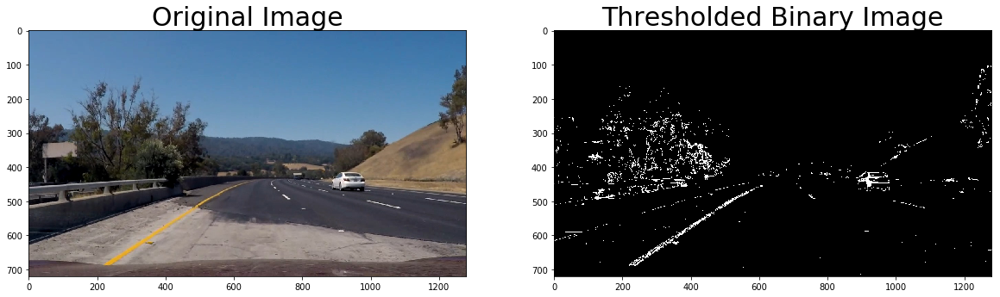

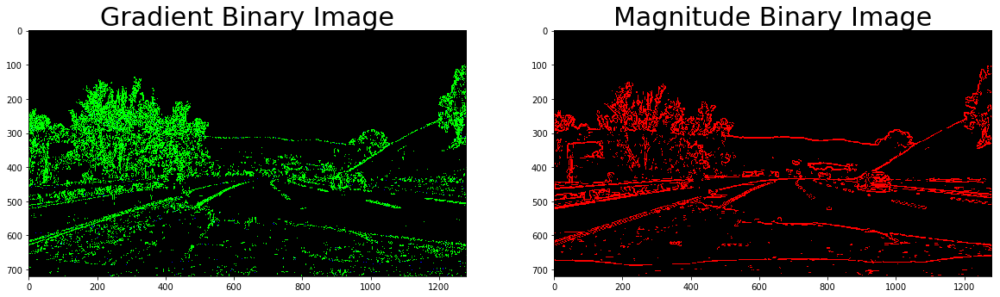

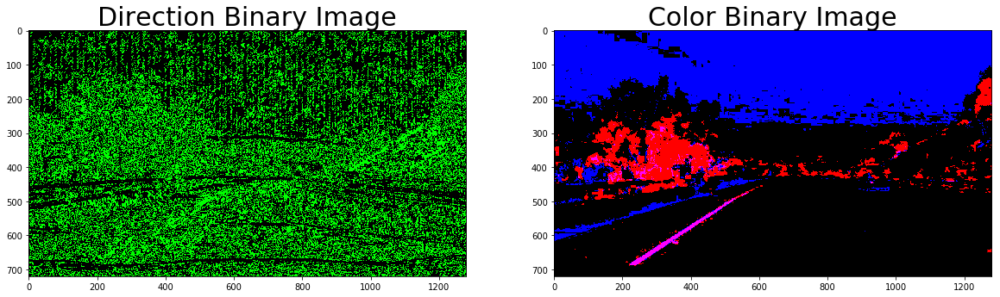

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [4]:
img = mpimg.imread('output_images/undistorted_test1.jpg')
original_img = img


def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    xaxis = 1 if orient == 'x' else 0
    yaxis = 1 if orient == 'y' else 0
    sobel = cv2.Sobel(gray, cv2.CV_64F, xaxis, yaxis)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output


def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    sobelxy = np.sqrt(sobelx ** 2 + sobely ** 2)
    scaled_sobel = np.uint8(255 * sobelxy / np.max(sobelxy))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output


def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    direction = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(direction)
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    
    return binary_output


def hls_select(img, channel='s', thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if channel == 'h':
        c = hls[:,:,0]
    elif channel == 'l':
        c = hls[:,:,1]
    else:
        c = hls[:,:,2]
    binary_output = np.zeros_like(c)
    binary_output[(c >= thresh[0]) & (c <= thresh[1])] = 1
    
    return binary_output


from ipywidgets import interactive, interact
import ipywidgets as widgets
from IPython.display import display

ksize = 3


def get_thresholded(img, ksize, gx_min, gx_max, gy_min, gy_max, mag_min, mag_max,
                    dir_min, dir_max, s_min, s_max, h_min, h_max, l_min, l_max,
                    with_graph=False):
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(gx_min, gx_max))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(gy_min, gy_min))
    mag_binary = mag_thresh(img, sobel_kernel=9, thresh=(mag_min, mag_max))
    dir_binary = dir_thresh(img, sobel_kernel=9, thresh=(dir_min, dir_max))
    hls_s_binary = hls_select(img, channel='s', thresh=(s_min, s_max))
    hls_h_binary = hls_select(img, channel='h', thresh=(h_min, h_max))
    hls_l_binary = hls_select(img, channel='l', thresh=(l_min, l_max))
    
    empty_binary = np.zeros_like(dir_binary)
    grad_binary = np.dstack((empty_binary, gradx, grady))
    magnitude_binary = np.dstack((mag_binary, empty_binary, empty_binary))
    direction_binary = np.dstack((empty_binary, dir_binary, empty_binary))
    color_binary = np.dstack((hls_h_binary, empty_binary, hls_s_binary))
    
    combined = np.zeros_like(dir_binary)
    # combined[((gradx == 1) & (grady == 1) | (mag_binary == 1) & (hls_h_binary == 1)) | ((dir_binary == 1) & (hls_binary == 1))] = 1
    # combined[((gradx == 1) & (grady == 1)) & (mag_binary == 1) | ((dir_binary == 1) & (hls_h_binary == 1)) | (hls_binary == 1) & ((gradx == 1) & (grady == 1) & (hls_h_binary == 1))] = 1
    
    combined[((dir_binary == 1) & (hls_h_binary == 1)) & (hls_s_binary == 1) &
             ((dir_binary == 1) & (hls_h_binary == 1) | (hls_l_binary == 1)) |
             (((gradx == 1) & (grady == 1) & ((mag_binary == 1)) | (hls_l_binary == 1))) |
             (((gradx == 1) & (grady == 1) | (mag_binary == 1)) & (hls_s_binary == 1)) |
             ((gradx == 1) & (grady == 1) | (mag_binary == 1) & (hls_h_binary == 1))] = 1

    if with_graph:
        i = 100
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(combined, cmap='gray')
        ax2.set_title('Thresholded Binary Image', fontsize=30)
        plt.figure(i)
        i += 1
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(grad_binary)
        ax1.set_title('Gradient Binary Image', fontsize=30)
        ax2.imshow(magnitude_binary)
        ax2.set_title('Magnitude Binary Image', fontsize=30)
        plt.figure(i)
        i += 1
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(direction_binary)
        ax1.set_title('Direction Binary Image', fontsize=30)
        ax2.imshow(color_binary)
        ax2.set_title('Color Binary Image', fontsize=30)
        plt.figure(i)
        i += 1
        
        plt.show()

    return combined


def _get_thresholded(ksize, gx_min, gx_max, gy_min, gy_max, mag_min, mag_max,
                    dir_min, dir_max, s_min, s_max, h_min, h_max, l_min, l_max,
                    with_graph):

    # img = mpimg.imread('output_images/undistorted_test1.jpg')
    img = mpimg.imread('bad_images/bad_image3.jpg')
    return get_thresholded(img, ksize, gx_min, gx_max, gy_min, gy_max, mag_min, mag_max,
                    dir_min, dir_max, s_min, s_max, h_min, h_max, l_min, l_max, with_graph=with_graph)


w = interactive(_get_thresholded,
        # img     = img,
        ksize   = widgets.IntSlider(min=1,max=31,step=2, value=5),
        gx_min  = widgets.IntSlider(min=0, max=256, value=10), 
        gx_max  = widgets.IntSlider(min=0, max=256, value=100),
        gy_min  = widgets.IntSlider(min=0, max= 256, value=30), 
        gy_max  = widgets.IntSlider(min=0, max=256, value=100),
        mag_min = widgets.IntSlider(min=0, max=256, value=30), 
        mag_max = widgets.IntSlider(min=0, max=256, value=100),
        dir_min = widgets.FloatSlider(min=0, max=np.pi/2, value=0.40), 
        dir_max = widgets.FloatSlider(min=0, max=np.pi/2, value=1.2),
        h_min   = widgets.IntSlider(min=0, max=256, value=18),
        h_max   = widgets.IntSlider(min=0, max=256, value=100),
        s_min   = widgets.IntSlider(min=0, max=256, value=90), 
        s_max   = widgets.IntSlider(min=0, max=256, value=256),
        l_min   = widgets.IntSlider(min=0, max=256, value=200), 
        l_max   = widgets.IntSlider(min=0, max=256, value=255),
        # wv_min  = widgets.IntSlider(min=0, max=256, value=200), 
        # wv_max  = widgets.IntSlider(min=0, max=256, value=256),
        # ws_min  = widgets.IntSlider(min=0, max=256, value=10), 
        # ws_max  = widgets.IntSlider(min=0, max=256, value=256),
        with_graph=True)

# combined = get_thresholded(3, 10, 100, 30, 100, 30, 100, 0.4, 1.2, 90, 255, 17, 60, True)

# display(get_thresholded)
display(w)
combined = w.result

### Criteria: Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

First I retrieve the points that create a trapezoid, not perfect though, which represents the rectangle of the road in the bird eye view on the `strait lines1.jpg`. Then I warped the image to map the corners into the ones on the image where corners shape the rectangle. Tthe x corrdinate of a side line is given by the mean of the original x coordinates of the two points make the line.

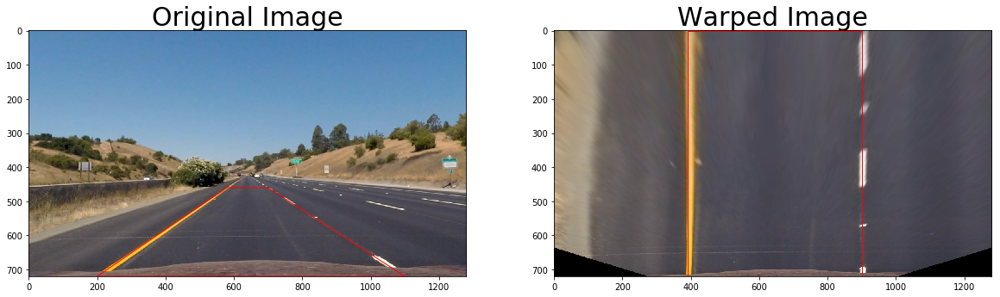

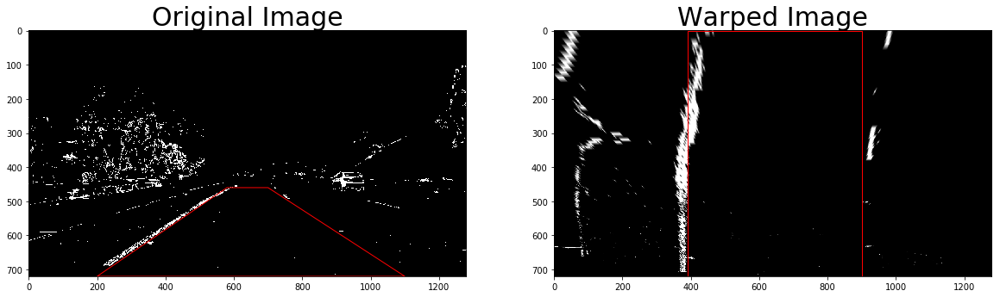

In [5]:
from matplotlib import patches

def warp_img(thresholded, with_graph=False):
    if with_graph:
        img = mpimg.imread('output_images/undistorted_straight_lines1.jpg')
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        # Display the image
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
    # Create a Rectangle patch
    # src = np.float32([(630, 480), (200, 680), (1040, 680), (670, 480)])
    src = np.float32([(580, 460), (200, thresholded.shape[0]),
                      (1100, thresholded.shape[0]), (700, 460)])
    if with_graph:
        rect = patches.Polygon(src, linewidth=1, edgecolor='r', facecolor='none')
        # Add the patch to the Axes
        ax1.add_patch(rect)
    
    dst_left_x = (src[0][0] + src[1][0]) / 2
    dst_right_x = (src[2][0] + src[3][0]) / 2
    dst = np.float32([(dst_left_x, 0),
                    (dst_left_x, thresholded.shape[0]),
                    (dst_right_x, thresholded.shape[0]),
                    (dst_right_x, 0)])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

    if with_graph:
        warped = cv2.warpPerspective(
            img, M, img.shape[0:2][::-1], flags=cv2.INTER_LINEAR)
        ax2.imshow(warped)
        ax2.set_title('Warped Image', fontsize=30)
        warped_rect = patches.Polygon(
            dst, linewidth=1, edgecolor='r', facecolor='none')
        ax2.add_patch(warped_rect)
        
        plt.show()
    
    # img = thresholded

    if with_graph:
        i = 100
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(thresholded, cmap='gray')
        ax1.set_title('Original Image', fontsize=30)
        rect = patches.Polygon(src, linewidth=1, edgecolor='r', facecolor='none')
        ax1.add_patch(rect)
    
    warped_img = cv2.warpPerspective(
        thresholded, M, thresholded.shape[0:2][::-1], flags=cv2.INTER_LINEAR)

    if with_graph:
        ax2.imshow(warped_img, cmap='gray')
        ax2.set_title('Warped Image', fontsize=30)
        warped_rect = patches.Polygon(
            dst, linewidth=1, edgecolor='r', facecolor='none')
        ax2.add_patch(warped_rect)
        plt.figure(i)
        i += 1

    return warped_img, M, Minv


warped_img, M, Minv = warp_img(combined, with_graph=True)

### Criteria: Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

I employed the simple sliding window technique for finding the lanes. Possible lane points are collected in each window and the poly lines are calculated to fit the collected points. The histrogram shown below is helpful to see if the points are in the expected region and they form lines. Recognizable two peeks are good signs.

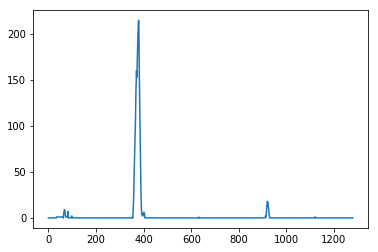

In [6]:
def get_histogram(warped_img, with_graph=False):
    binary_warped = warped_img.astype(int)
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    if with_graph:
        plt.plot(histogram)
        plt.figure(i)
        plt.show()
    return histogram


histogram = get_histogram(warped_img, with_graph=True)

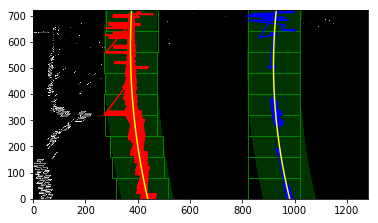

In [7]:
i = 200

def get_polynomials(warped_img, histogram, with_graph=False):
    out_img = np.dstack(
        (warped_img, warped_img, warped_img)) * 255
    out_img = out_img.astype(np.float64)
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    height, width = warped_img.shape
    
    nwindows = 9
    window_height = np.int(height/nwindows)
    nonzero = warped_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []
    
    rectangles = []
    
    for window in range(nwindows):
        win_y_low = height - (window + 1) * window_height
        win_y_high = win_y_low + window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # cv2.rectangle(out_img, (win_xleft_low, win_y_low),
        #               (win_xleft_high, win_y_high), (0, 255, 0), 3)
        rectangles.append(((win_xleft_low, win_y_low), (win_xleft_high, win_y_high)))
        # cv2.rectangle(out_img, (win_xright_low, win_y_low),
        #               (win_xright_high, win_y_high), (0, 255, 0), 3)
        rectangles.append(((win_xright_low, win_y_low), (win_xright_high, win_y_high)))
    
    
        good_left_inds = ((nonzeroy >= win_y_low) &
                          (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) &
                          (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) &
                           (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) &
                           (nonzerox < win_xright_high)).nonzero()[0]
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_currents = np.int(np.mean(nonzerox[good_right_inds]))
            
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
        
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
        
    ploty = np.linspace(0, height - 1, height)
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    

    if with_graph:
        fig,ax = plt.subplots(1)
        ax.imshow(out_img)
        
        for p in rectangles:
            ((x1, y1), (x2, y2)) = p
            rect = patches.Rectangle((x1, y1),x2 - x1, y2 - y1, linewidth=1,edgecolor='g',facecolor='none')
            ax.add_patch(rect)
        
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    if with_graph:
        plt.plot(nonzerox[left_lane_inds], nonzeroy[left_lane_inds], color='red')
        plt.plot(nonzerox[right_lane_inds], nonzeroy[right_lane_inds], color='blue')

        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        
    left_line = np.dstack((left_fitx, ploty))
    right_line = np.dstack((right_fitx, ploty))
    cv2.polylines(out_img, np.int_([left_line]), False, (255,255, 0), 2)
    cv2.polylines(out_img, np.int_([right_line]), False, (255,255, 0), 2)
        
    window_img = np.zeros_like(out_img)
        
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
        
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    if with_graph:
        plt.imshow(result)
        
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.gca().invert_yaxis()
        plt.show()

    return ploty, left_fitx, right_fitx, result


ploty, left_fitx, right_fitx, curvature = get_polynomials(warped_img, histogram, with_graph=True)

### Criteria: Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center.

I calculated the radius of the curvatures of the lanes using [the curvature formula](http://www.intmath.com/applications-differentiation/8-radius-curvature.php). I converted the unit of the curvatures from pixels to meters.

In [8]:
def get_curverads(ploty, left_fitx, right_fitx):
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/(right_fitx[np.int(y_eval)] - left_fitx[np.int(y_eval)]) # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty * ym_per_pix, left_fitx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, right_fitx * xm_per_pix, 2)

    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2 ) ** 1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) /np.absolute(2 * right_fit_cr[0])
    
    return left_curverad, right_curverad
    
left_curverad, right_curverad = get_curverads(ploty, left_fitx, right_fitx)

print(left_curverad, 'm', right_curverad, 'm')

652.398906018 m 547.860686555 m


In [9]:
def get_position(ploty, left_fitx, right_fity, center):
    y_eval = np.int(np.max(ploty))
    left = left_fitx[y_eval]
    right = right_fitx[y_eval]
    c = right - left
    p = center - c
    
    xm_per_pix = 3.7/(right_fitx[y_eval] - left_fitx[y_eval])
    
    return p * xm_per_pix

p = get_position(ploty, left_fitx, right_fitx, img.shape[1]/2)
print(abs(p), "m", "left" if p > 0 else "right")

0.581632466771 m left


### Criteria: Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.

I plotted the calculated poly lines with the inversion matrix, `Minv`, calculated in the warping step.

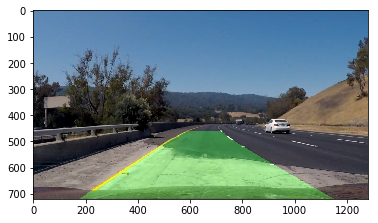

In [10]:
def detect_road(original_img, warped_img, Minv, ploty, left_fitx, right_fitx, with_graph=False):
    height, width = warped_img.shape
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    newwarp = cv2.warpPerspective(color_warp, Minv, (width, height))
    result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)
    if with_graph:
        plt.imshow(result)
        plt.show()

    return result


img = mpimg.imread('bad_images/bad_image3.jpg')

result = detect_road(img, warped_img, Minv, ploty, left_fitx, right_fitx, with_graph=True)

## Pipeline (video)

### Criteria: Provide a link to your final video output. Your pipeline should perform reasonably well on the entire project video (wobbly lines are ok but no catastrophic failures that would cause the car to drive off the road!)

I defined `detect_lane` function that wraps up all the steps above. It is a function takes the iamge and draw the are inside the lane. As additional features, it inserts the thresholded image and the image of the detected poly lines with colors corresponding to the current frame. It helps to get ideas of what's going on and eases the debugging a lot.

In [11]:
import scipy.ndimage

left_fitx_history=[]
right_fitx_history=[]

def detect_lane(img, nframes=1):
    global left_fitx_history
    global right_fitx_history
    undistorted, mat, dist = calculate_undistorted(img, objpoints, imgpoints)
    # thresholded = get_thresholded(undistorted)
    # ksize=5; gx_min=10; gx_max=100; gy_min=30; gy_max=100; mag_min=30; mag_max=100
    # dir_min=0.4; dir_max=1.2; s_min=90; s_max=255; h_min=18; h_max=100; l_min, l_max = (200, 255)
    thresholded = get_thresholded(img, 3, 10, 100, 30, 100, 30, 100, 0.4, 1.2, 90, 255, 18, 100, 200, 255, False)
    warped_img, M, Minv = warp_img(thresholded)
    histogram = get_histogram(warped_img)
    ploty, left_fitx, right_fitx, curvature = get_polynomials(warped_img, histogram)
    
    resized_thresholded = scipy.ndimage.zoom(thresholded, 0.25, order=3)
    h, w = resized_thresholded.shape[:2]
    resized_curvature = scipy.misc.imresize(curvature, (h, w))
    # resized_curvature = scipy.ndimage.zoom(curvature, 0.25, order=3)
        
    if nframes != 1:
        if len(left_fitx_history) >= nframes:
            np.delete(left_fitx_history, 0, axis=0)
            np.delete(right_fitx_history, 0, axis=0)
        if len(left_fitx_history) <= 0:
            left_fitx_history = np.array([left_fitx])
            right_fitx_history = np.array([right_fitx])
        else:
            left_fitx_history = np.vstack((left_fitx_history, left_fitx))
            right_fitx_history = np.vstack((right_fitx_history, right_fitx))

        updated_left_fitx = np.median(left_fitx_history, axis=0)
        updated_right_fitx = np.median(right_fitx_history, axis=0)
    else:
        updated_left_fitx = left_fitx
        updated_right_fitx = right_fitx
    result = detect_road(img, warped_img, Minv, ploty, updated_left_fitx, updated_right_fitx)
    
    result[0:h, 0:w] = np.dstack((resized_thresholded, resized_thresholded, resized_thresholded)) * 255
    result[0:h, w:2*w] = resized_curvature
    
    left_curverad, right_curverad = get_curverads(ploty, left_fitx, right_fitx)
    
    cv2.putText(result, "Left curve radius: {0:.3f} m".format(left_curverad), (50,600),
                cv2.FONT_HERSHEY_COMPLEX, 0.8, (255,255,255))
    cv2.putText(result, "Right curve radius: {0:.3f} m".format(right_curverad), (50,630),
                cv2.FONT_HERSHEY_COMPLEX, 0.8, (255,255,255))
    p = get_position(ploty, left_fitx, right_fitx, img.shape[1]/2)
    cv2.putText(result, "Position from the center: {0:.3f} m ".format(p) + ("left" if p > 0 else "right"), (50, 660),
                cv2.FONT_HERSHEY_COMPLEX, 0.8, (255,255,255))
    
    # if len(left_fitx_history) == 5:
    #     left_fitx_history.pop()
    #     right_fitx_history.pop()
    # left_fitx_history.append(left_fitx)
    # right_fitx_history.append(right_fitx)
    
    # updated_left_fitx = np.median(left_fitx_history, axis=0)
    # updated_right_fitx = np.median(right_fitx_history, axis=0)
        
    # result = detect_road(img, warped_img, Minv, ploty, updated_left_fitx, updated_right_fitx)
    
    return result

I also tested on several images including the difficult frames retrieved from the project video. I tried the `detect_lane` function on the video hundreds of times and picked the frames where it failed to detect the lane. So they work like unit tests before a video processing that costs a huge time. Once the following test images are properly processed, we can be confident and move on to the project video.

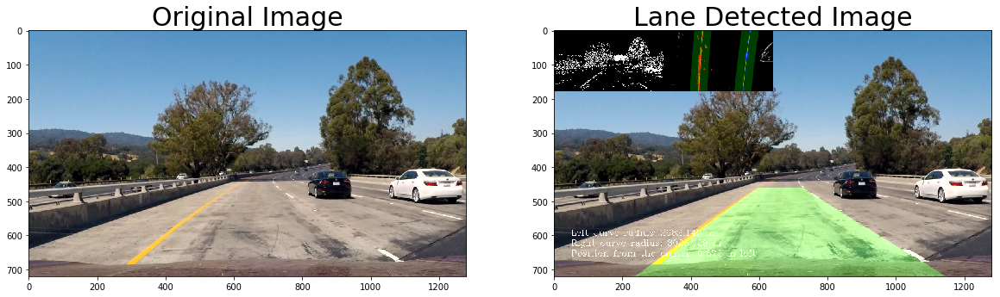

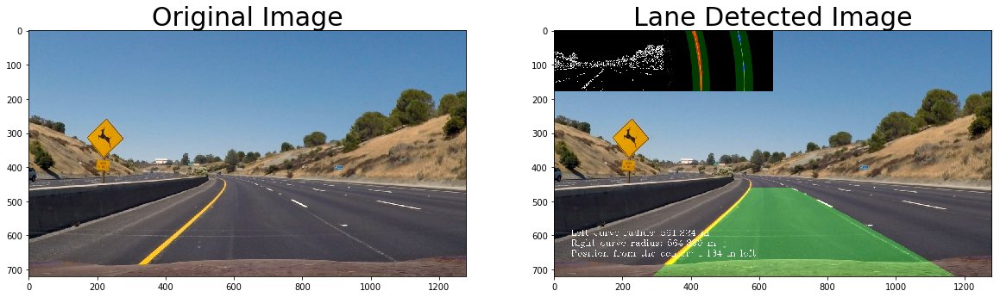

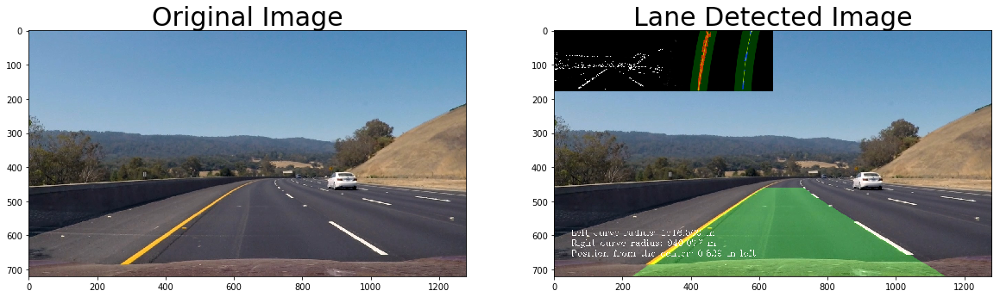

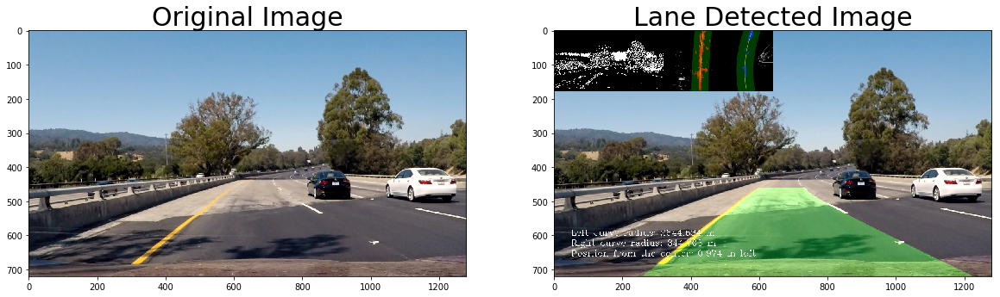

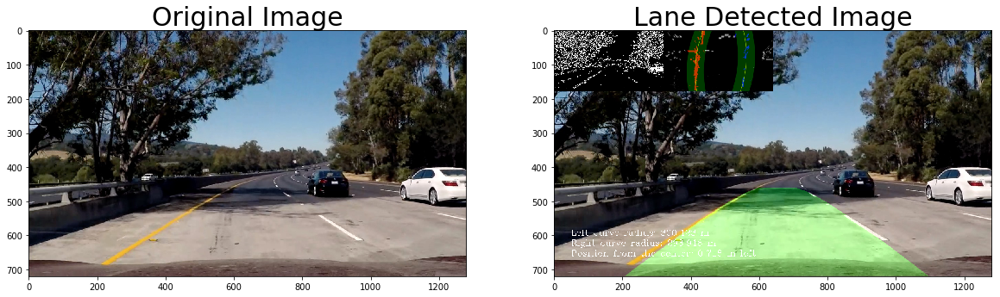

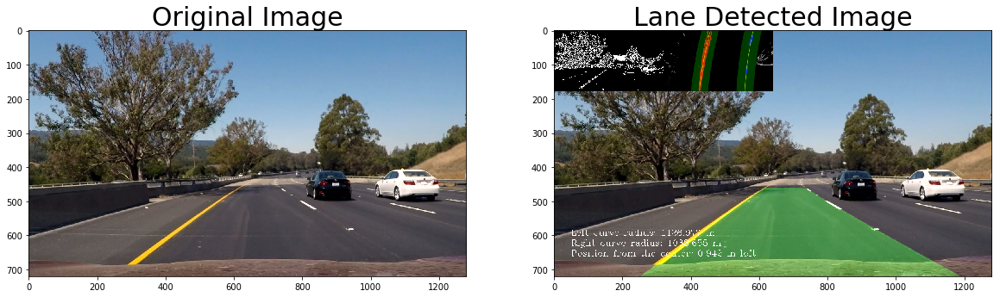

In [12]:
test_images = glob.glob('test_images/test*.jpg')
for test_image in test_images:
    original_img = mpimg.imread(test_image)

    left_fitx_history = np.array([])
    right_fitx_history = np.array([])
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    # Display the image
    ax1.imshow(original_img)
    ax1.set_title('Original Image', fontsize=30)

    ax2.imshow(detect_lane(original_img))
    ax2.set_title('Lane Detected Image', fontsize=30)
    # plt.figure(i)
    # i += 1

    plt.show()

bad_images/bad_image.jpg


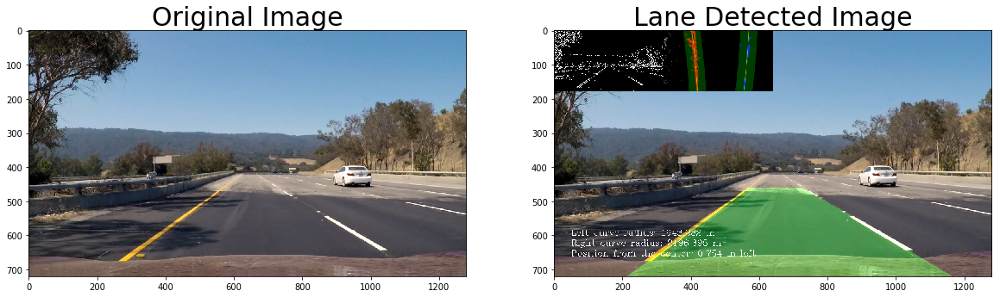

bad_images/bad_image1.jpg


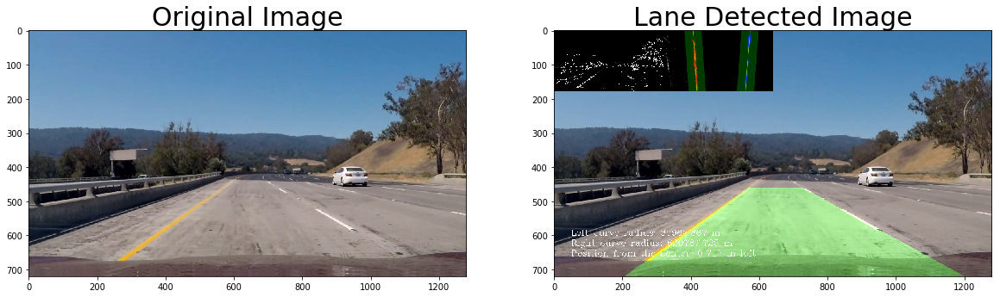

bad_images/bad_image2.jpg


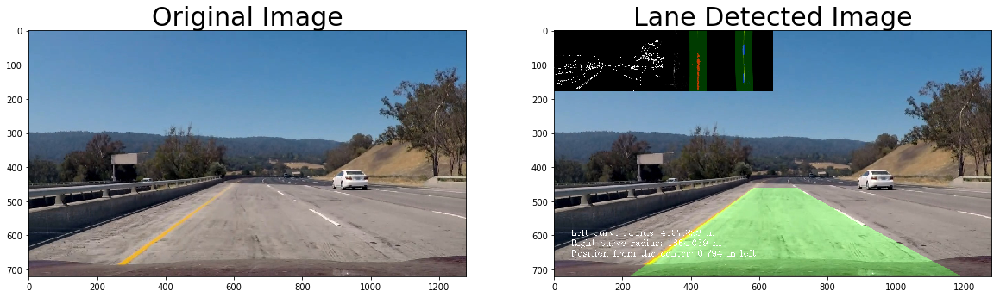

bad_images/bad_image3.jpg


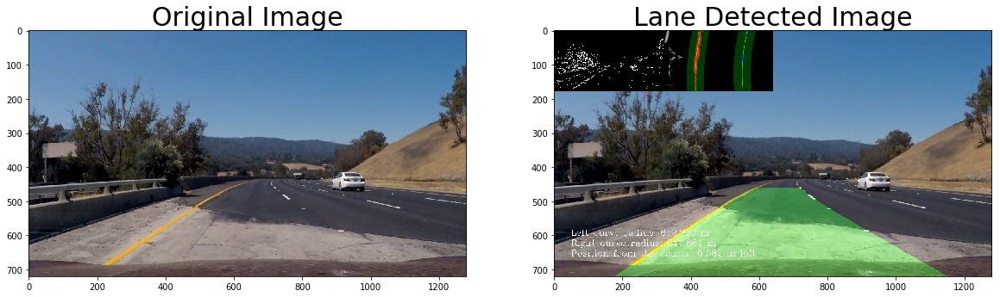

bad_images/bad_image4.jpg


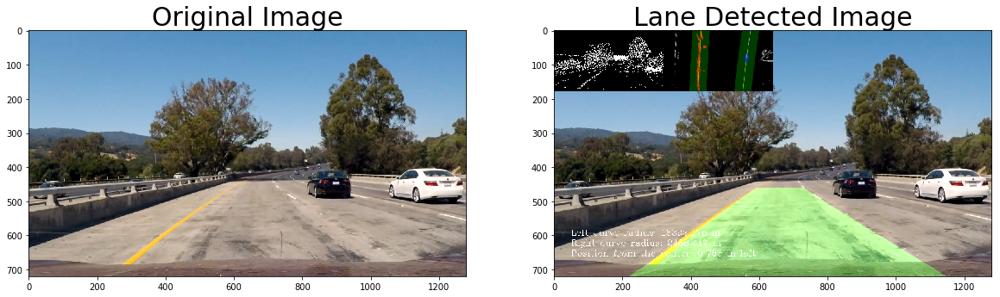

bad_images/bad_image5.jpg


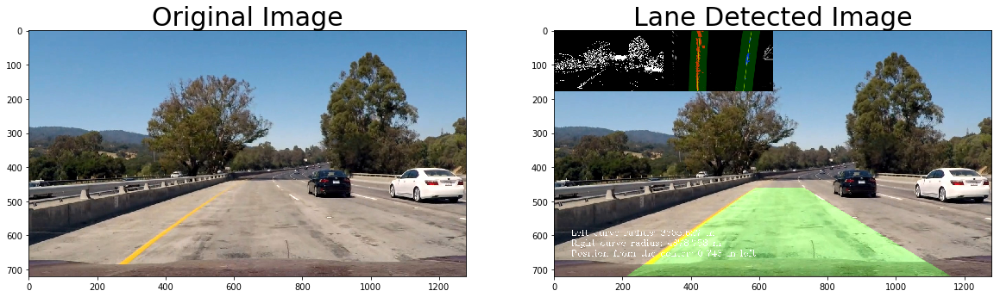

bad_images/bad_image6.jpg


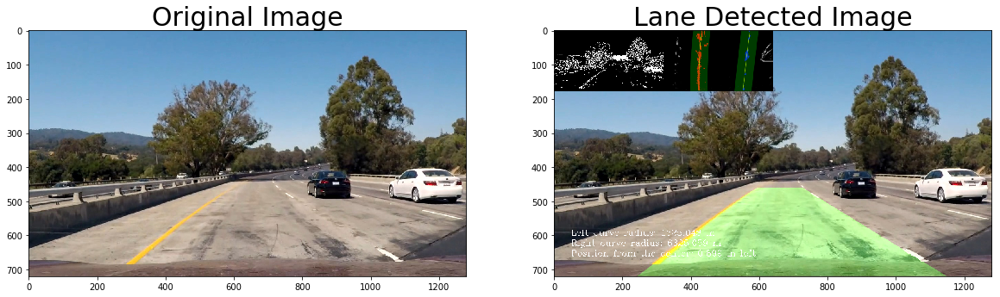

In [13]:
bad_images = glob.glob('bad_images/bad*.jpg')
for bad_image in bad_images:
    print(bad_image)
    original_img = mpimg.imread(bad_image)

    left_fitx_history = np.array([])
    right_fitx_history = np.array([])
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    # Display the image
    ax1.imshow(original_img)
    ax1.set_title('Original Image', fontsize=30)

    ax2.imshow(detect_lane(original_img))
    ax2.set_title('Lane Detected Image', fontsize=30)
    # plt.figure(i)
    # i += 1

    plt.show()

The video procesisng take more than one and a half hour on my laptop. So I don't show the video here but you can find the one in `output_images` directory. You can run the following cell but please note it takes some time to finish.

In [14]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output = 'output_images/detected_lane.mp4'
clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(detect_lane) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

[MoviePy] >>>> Building video output_images/detected_lane.mp4
[MoviePy] Writing video output_images/detected_lane.mp4


100%|█████████▉| 1260/1261 [2:02:33<00:05,  5.41s/it]  | 1/1261 [00:05<2:01:27,  5.78s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/detected_lane.mp4 

CPU times: user 2h 13s, sys: 3min 46s, total: 2h 3min 59s
Wall time: 2h 2min 35s


In [15]:
# Import everything needed to edit/save/watch video clips
# from moviepy.editor import VideoFileClip
# from IPython.display import HTML

# video_output = 'output_images/detected_challenge_video_debug.mp4'
# clip1 = VideoFileClip("challenge_video.mp4")
# video_clip = clip1.fl_image(detect_lane) #NOTE: this function expects color images!!
# %time video_clip.write_videofile(video_output, audio=False)

# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(video_output))

In [16]:
# Import everything needed to edit/save/watch video clips
# from moviepy.editor import VideoFileClip
# from IPython.display import HTML

# video_output = 'output_images/detected_harder_challenge_video_debug.mp4'
# clip1 = VideoFileClip("harder_challenge_video.mp4")
# video_clip = clip1.fl_image(detect_lane) #NOTE: this function expects color images!!
# %time video_clip.write_videofile(video_output, audio=False)

# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>
# """.format(video_output))

## Discussion

### Criteria: Briefly discuss any problems / issues you faced in your implementation of this project. Where will your pipeline likely fail? What could you do to make it more robust?

My `detect_lane` function works very well for the simplest project video. However, it fails on the challenge videos that conains more steep curves, the tough lighting condition and the sudden interruption of the overtaking motorcycles/cars.

More time to tackle the challenge videos definitely is helpful but it would take much more time to tune the paramerters to make it work against the challenge video. And the lighting cant' be overcome with the color baesd threshold filters.

So I believe the fundamental change of the recognition method of the environment, such as other sensors, is required.